Notas: Usar ajuste de contraste / window level antes de guardar as imagens?
Aplicar também a MRI, depois
Coordenadas a partir da deteção dos blobs

NÚMER DE CONTOURS antes dos filtros:  203
Center_x, center_y =  256 256
NÚMERO DE CONTOURS depois dos filtros:  158
TEST CONTOUR length:  158
############## 
 Centros dos 10 primeiros blobs:
[327, 323]
[318, 323]
[307, 324]
[297, 323]
[286, 324]
[276, 323]
[269, 324]
[236, 323]
[226, 323]
[195, 323]


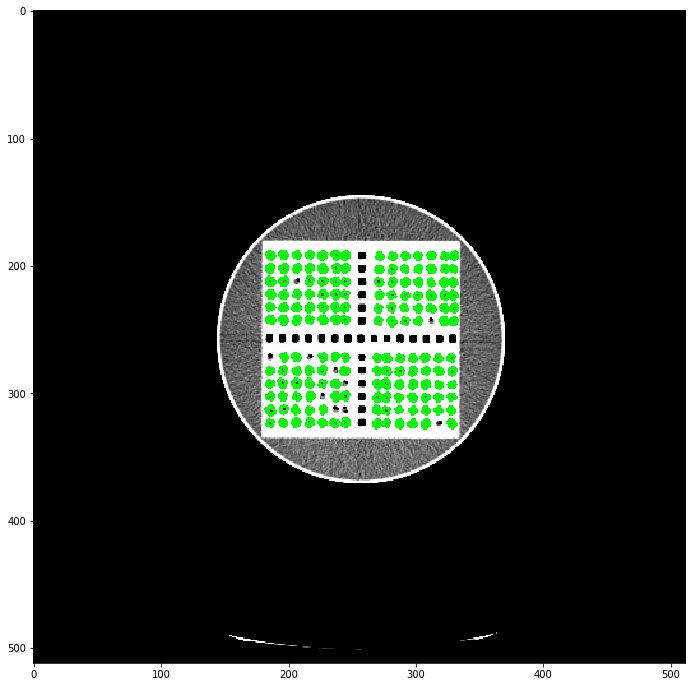

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#import image
#img = cv2.imread("C:/Users/bernc/Downloads/converted.jpg", 0)
img = cv2.imread("C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT_PNG/5_140.png", 0)


#Thresh
ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
#Original: ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

#Finding the contours in the image
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS) 
#original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

# Get the center of the image
image_height, image_width = img.shape[:2]
center_x = image_width // 2
center_y = image_height // 2
print('Center_x, center_y = ',center_x,center_y)

# Define the minimum contour area and maximum distance from center
min_contour_area = 10  # adjust as needed #OG: 10
max_contour_area = 70  # adjust as needed #OG: 70
max_distance_from_center = 500  # adjust as needed; para a mesa não aparecer #OG: 500
#intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

# Define the circularity threshold
circularity_threshold = 0.7  # adjust as needed #OG: 0.7

# Filter contours based on size and distance from center
filtered_contours = []


intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
#Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
#Podia usar critério mais relaxado
for contour in contours:
    mask = np.zeros(img.shape, dtype=np.uint8)
    cv2.drawContours(mask, [contour], 0, 255, -1)
    mean_intensity = cv2.mean(img, mask=mask)[0]
    intensity_array.append(mean_intensity)
#print(intensity_array)
#intensity_threshold = np.mean(intensity_array)
##Agora, implemento threshold que é 10% abaixo da média da imagem
intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

center_coordinates_x = []
center_coordinates_y = []
center_coordinates = []

for contour in contours:
    # Calculate the contour area
    contour_area = cv2.contourArea(contour)
    # Calculate the area and perimeter of the contour
    perimeter = cv2.arcLength(contour, True)
    
    # Calculate the circularity of the contour
    circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero
    
    if contour_area >= min_contour_area and contour_area <= max_contour_area:
        # Calculate the centroid of the contour
        M = cv2.moments(contour)
        centroid_x = int(M["m10"] / M["m00"])
        centroid_y = int(M["m01"] / M["m00"])
        center_coordinates_x.append(centroid_x)
        center_coordinates_y.append(centroid_y)
        #print(centroid_x,centroid_y) #print aos centros dos blobs
        
        # Calculate the distance from the centroid to the center of the image
        distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)
        
        # Filter contours based on distance from center
        if distance_from_center <= max_distance_from_center:
            # Filter contours based on circularity
            if circularity >= circularity_threshold:
                #filtered_contours.append(contour)
                mask = np.zeros(img.shape, dtype=np.uint8)
                cv2.drawContours(mask, [contour], 0, 255, -1)
                mean_intensity = cv2.mean(img, mask=mask)[0]
                #print(mean_intensity)
                if mean_intensity > intensity_threshold:
                    filtered_contours.append(contour)

    

print('NÚMERO DE CONTOURS depois dos filtros: ', len(filtered_contours))
# Draw filtered contours on the original image
image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

print('TEST CONTOUR length: ',len(filtered_contours))




# Display the original image with filtered contours
##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
##cv2.waitKey(0)
##cv2.destroyAllWindows()


#save output img
##cv2.imwrite('output_img.png', img)

# display it
plt.figure(figsize=(12,12))
imgplot = plt.imshow(image_with_filtered_contours)

print('############## \n Centros dos 10 primeiros blobs:')
for x, y in zip(center_coordinates_x[:10], center_coordinates_y[:10]):
    print("[{}, {}]".format(x, y))


## Determinar coordenadas centrais

## Para todas as slices

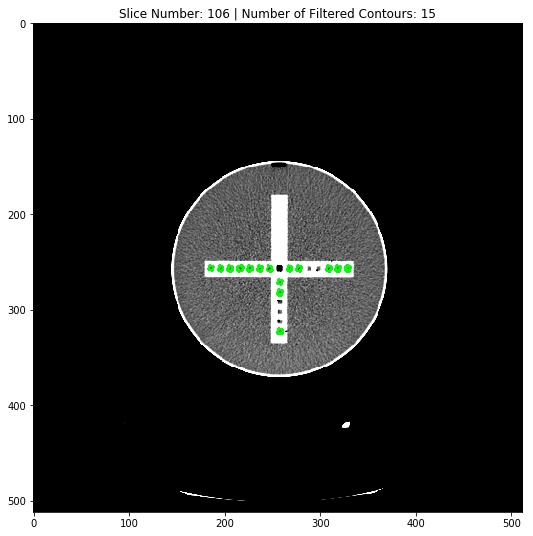

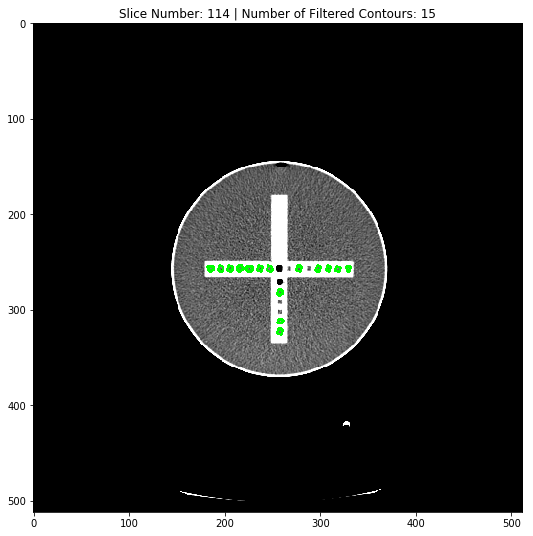

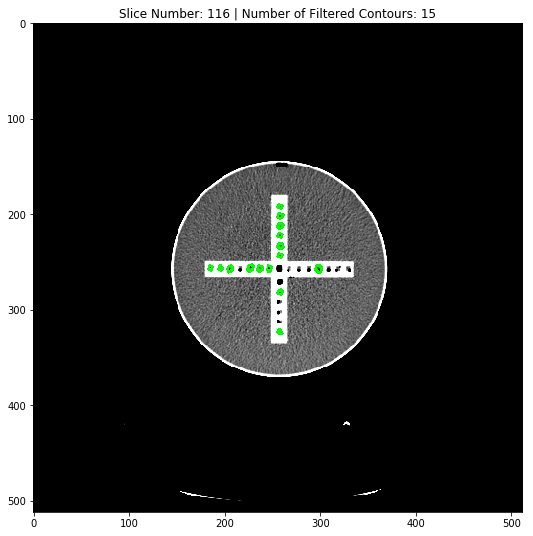

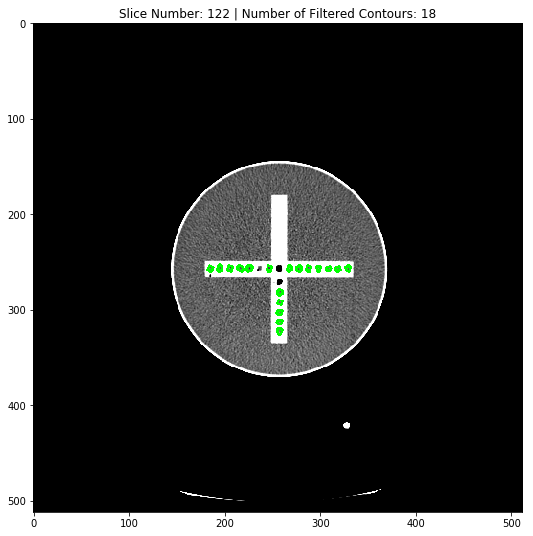

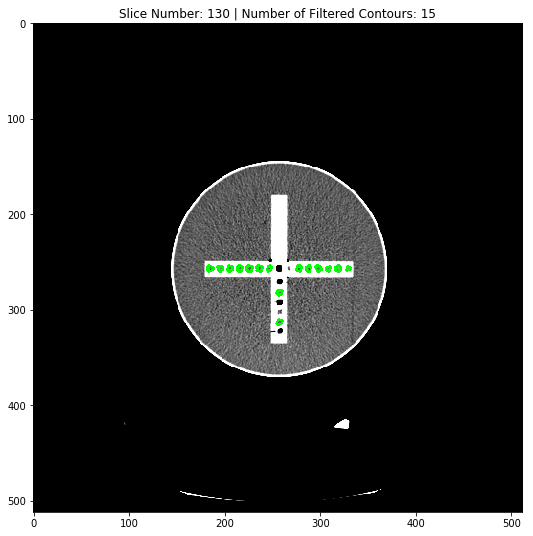

...

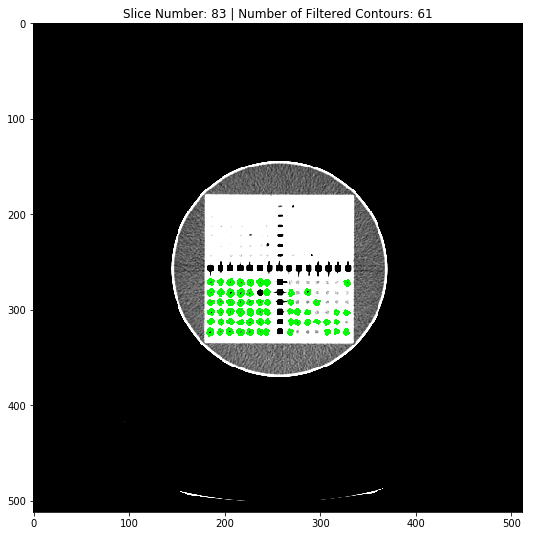

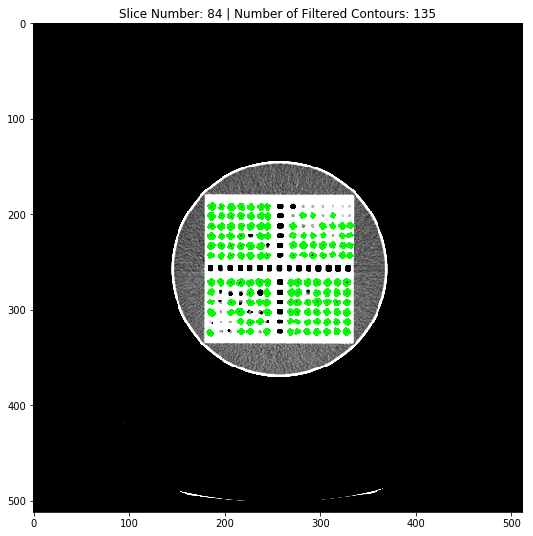

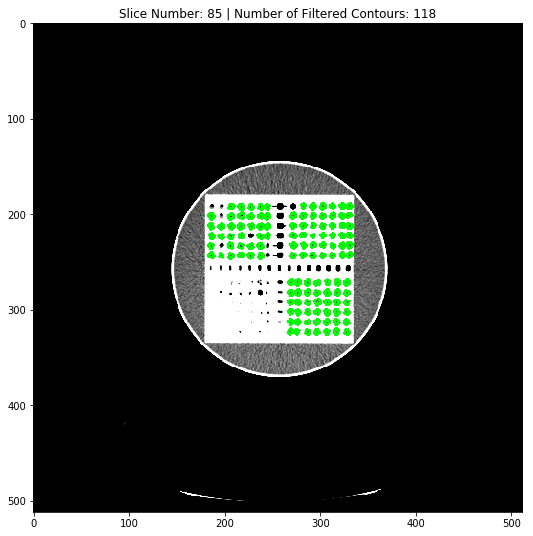

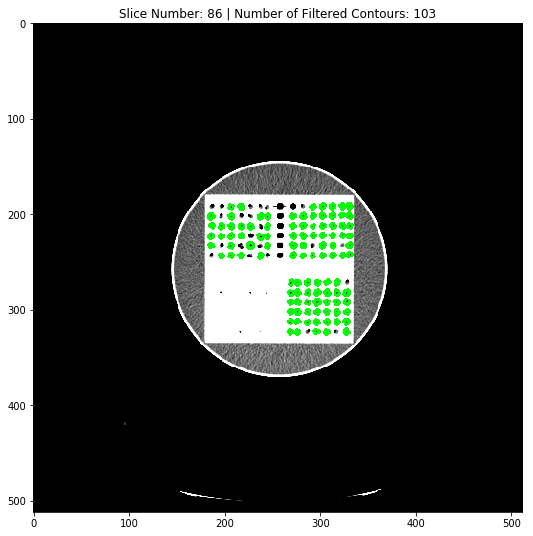

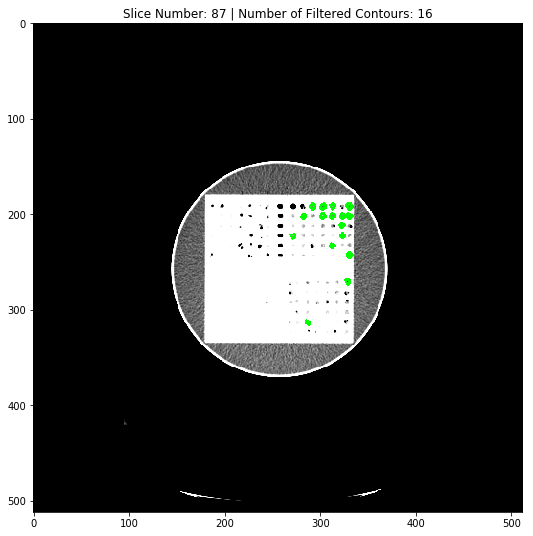

There are 30 slices with 15 or more detected inserts | Slice numbers: [106, 114, 116, 122, 130, 132, 137, 138, 139, 140, 141, 142, 25, 26, 27, 28, 29, 30, 36, 42, 50, 52, 58, 66, 82, 83, 84, 85, 86, 87]


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define folder path
folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT_PNG/" 

slices_15_plus_points = []
num_slices_15_plus_points = 0
# Loop over all files in the folder
for file_name in os.listdir(folder_path):
    #print(file_name)
    if file_name.endswith(".jpg") or file_name.endswith(".png"):  # Update with image file extensions
        slice_number = int(file_name[2:-4]) # Extract the slice number from the file name
        #print(f"Slice number: {slice_number}")
        # Read image
        image_path = os.path.join(folder_path, file_name)
        img = cv2.imread(image_path, 0)


        #Thresh
        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
        #Original: ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS) 
        #original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
        #print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 10  # adjust as needed #OG: 10
        max_contour_area = 70  # adjust as needed #OG: 70
        max_distance_from_center = 160  # adjust as needed; para a mesa não aparecer #OG: 500
        #intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []


        intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
        #Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
        #Podia usar critério mais relaxado
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            # Calculate the area and perimeter of the contour
            perimeter = cv2.arcLength(contour, True)

            # Calculate the circularity of the contour
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                # Calculate the centroid of the contour
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])

                # Calculate the distance from the centroid to the center of the image
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Filter contours based on distance from center
                if distance_from_center <= max_distance_from_center:
                    # Filter contours based on circularity
                    if circularity >= circularity_threshold:
                        #filtered_contours.append(contour)
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        #print(mean_intensity)
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)



        #print('NÚMER DE CONTOURS depois dos filtros: ', len(filtered_contours))
        # Draw filtered contours on the original image
        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)


        # Display the original image with filtered contours
        ##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
        ##cv2.waitKey(0)
        ##cv2.destroyAllWindows()


        #save output img
        ##cv2.imwrite('output_img.png', img)

        # display it
        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points%1 == 0: #so not all are shown, but only every 2 appliable slices, I can use %2, for example
                plt.figure(figsize=(9,9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()
print("There are {} slices with 15 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))

Now providing DICOM folder as input instead of already giving already transformed .png folder

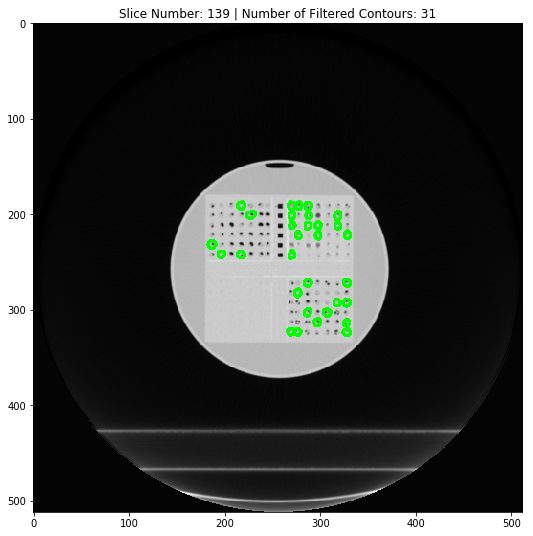

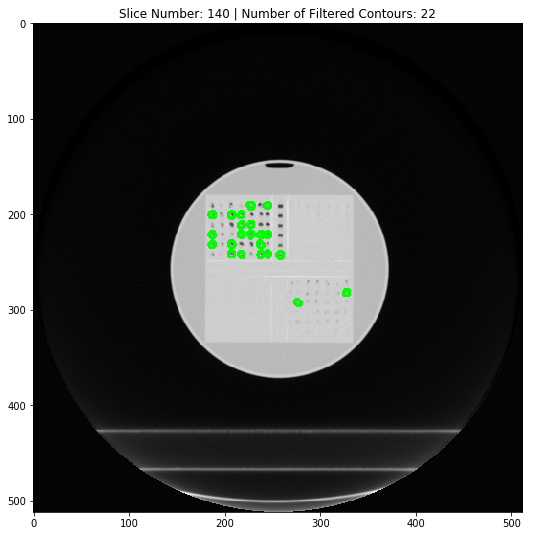

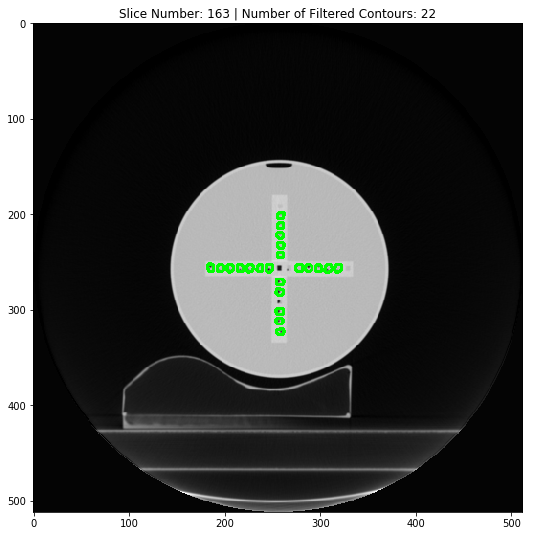

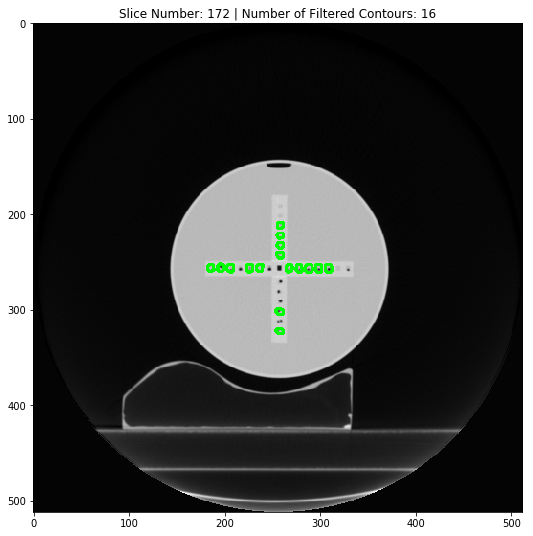

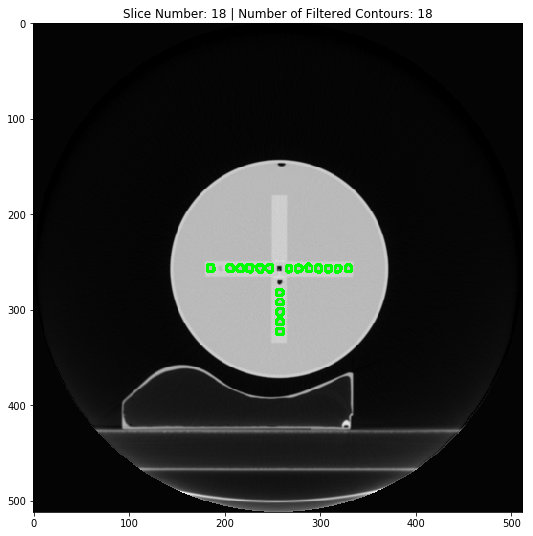

...

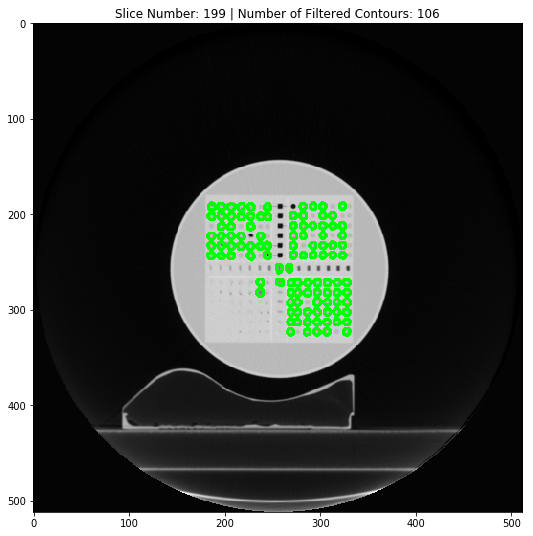

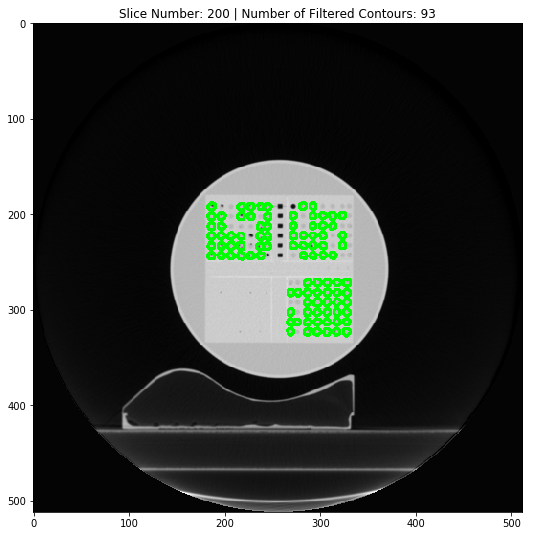

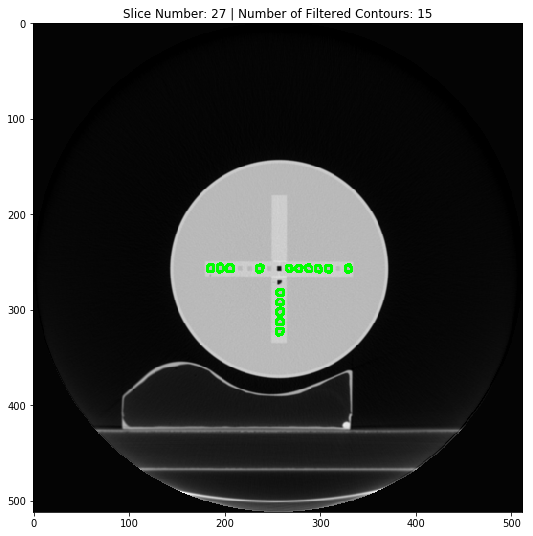

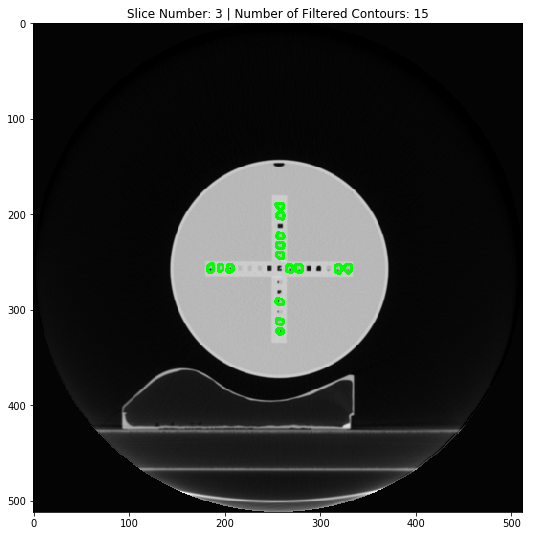

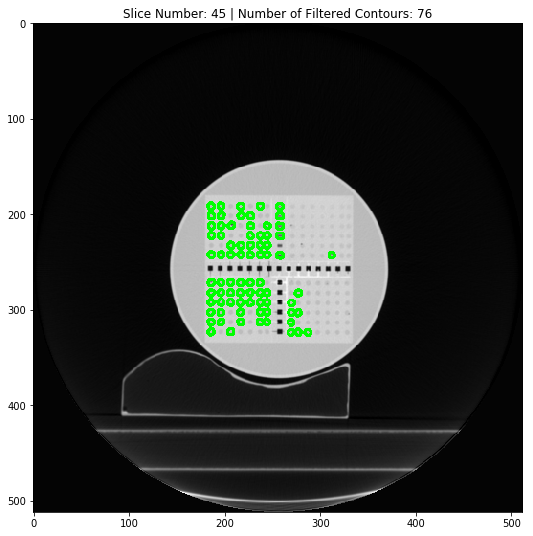

There are 15 slices with 10 or more detected inserts | Slice numbers: [139, 140, 163, 172, 18, 180, 19, 196, 197, 198, 199, 200, 27, 3, 45]


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder paths
dicom_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT Copy/" 
png_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT_PNG_V2/" 

# Convert DICOM images to PNG
i = 0
for file_name in os.listdir(dicom_folder_path):
    i+= 1
    if file_name.endswith(".dcm"):
        dicom_path = os.path.join(dicom_folder_path, file_name)
        dicom_image = pydicom.dcmread(dicom_path)
        png_file_name = str(i) + ".png"
        png_path = os.path.join(png_folder_path, png_file_name)

        # Normalize pixel values to the full range of 16-bit grayscale
        img = dicom_image.pixel_array
        img_min = np.min(img)
        img_max = np.max(img)
        img = ((img - img_min) / (img_max - img_min) * (2 ** 16 - 1)).astype(np.uint16)

        # Save the image as 16-bit grayscale PNG
        cv2.imwrite(png_path, img)

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the PNG folder
for file_name in os.listdir(png_folder_path):
    if file_name.endswith(".png"):
        slice_number = int(file_name[:-4]) # Extract the slice number from the file name
        image_path = os.path.join(png_folder_path, file_name)
        img = cv2.imread(image_path, 0)

        #Thresh
        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 30 #OG: 10 
        max_contour_area = 70
        max_distance_from_center = 160
        circularity_threshold = 0.8

        # Filter contours based on size and distance from center
        filtered_contours = []

        intensity_array = []
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)

        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                if distance_from_center <= max_distance_from_center:
                    if circularity >= circularity_threshold:
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 1 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))


Teste a tentar filtrar as colunas e fila centrais por condição:

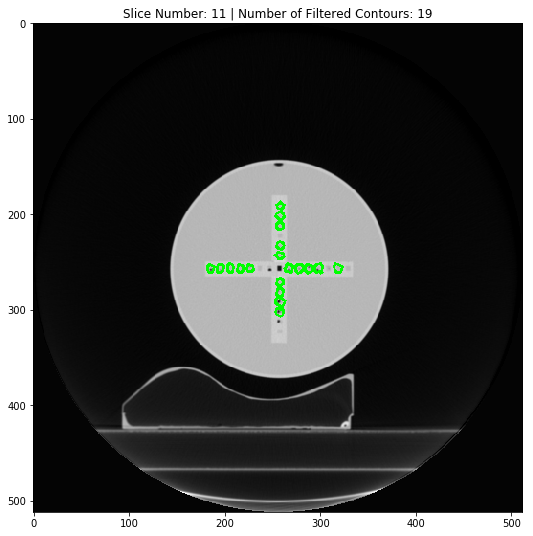

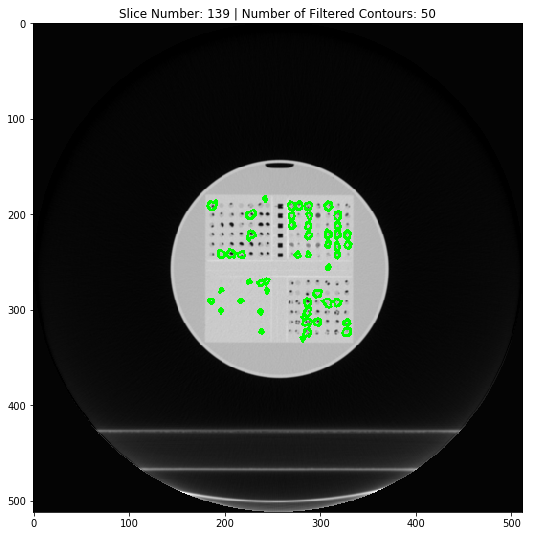

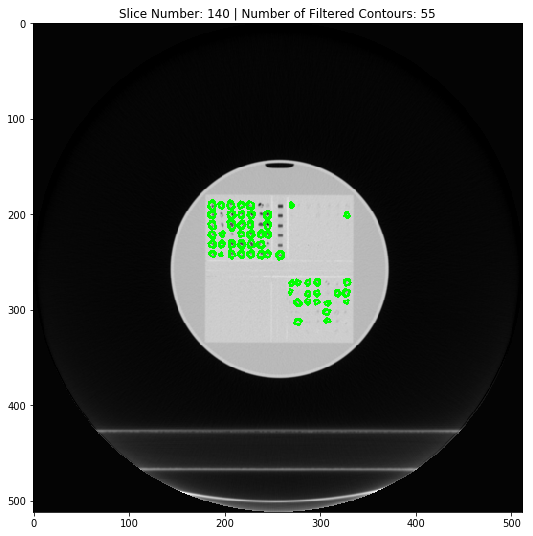

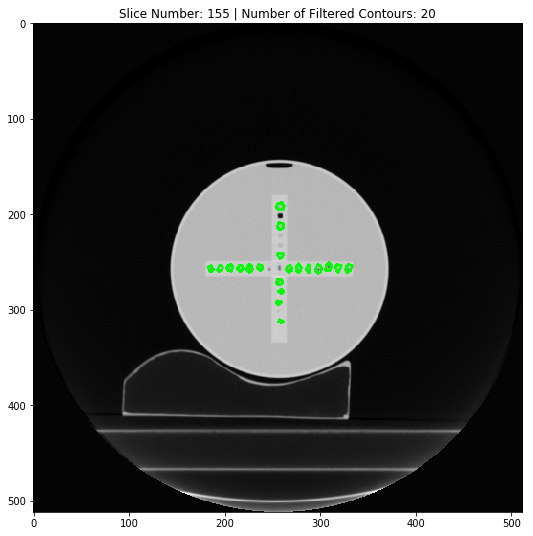

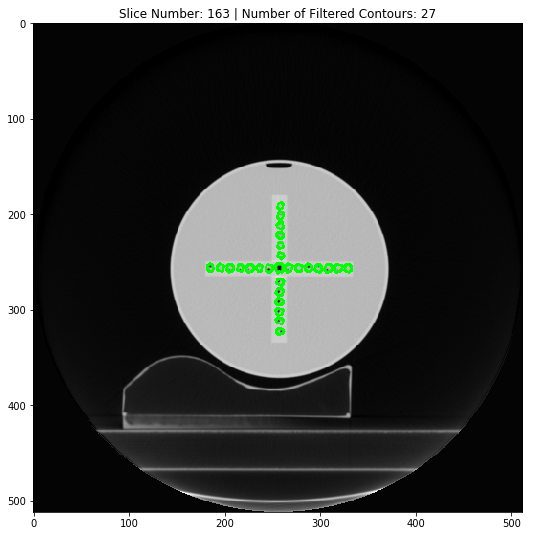

...

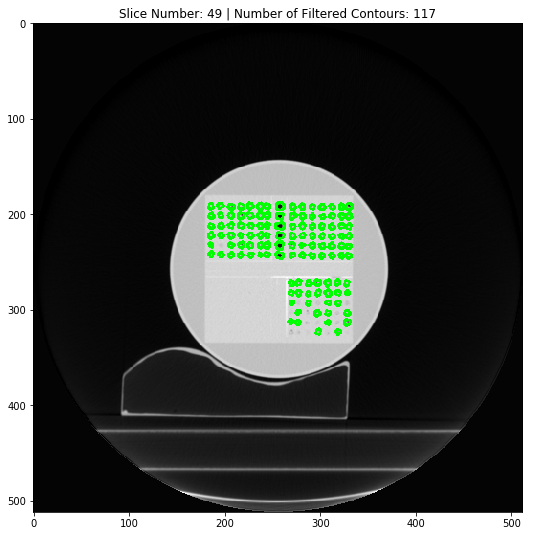

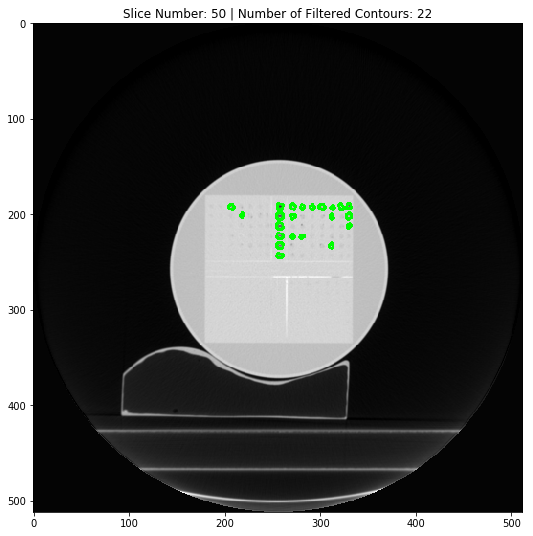

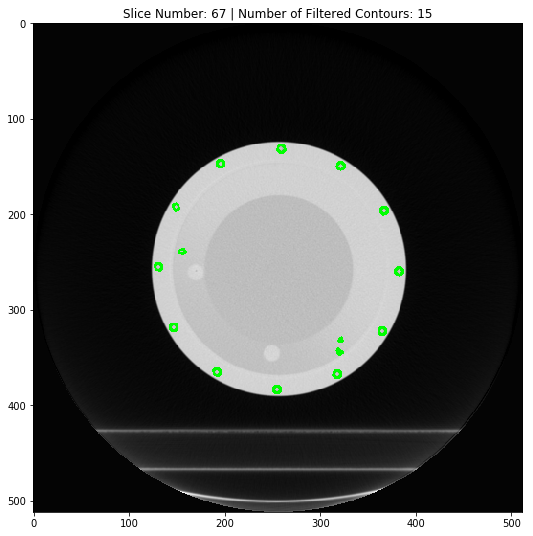

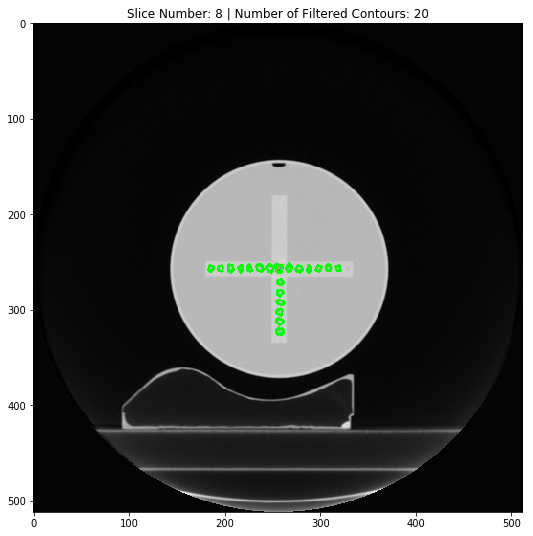

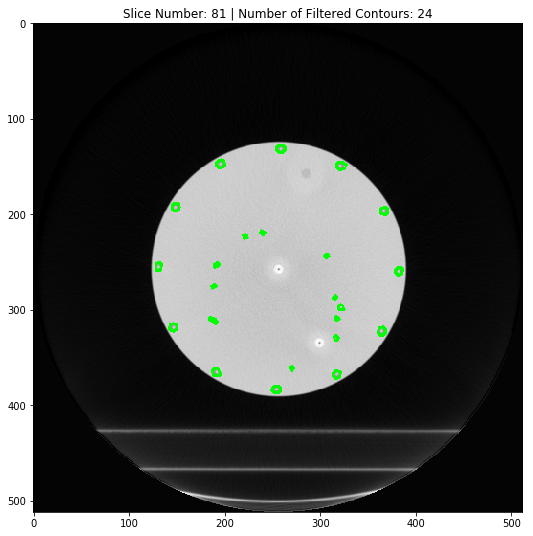

There are 39 slices with 10 or more detected inserts | Slice numbers: [11, 139, 140, 155, 163, 164, 172, 173, 18, 180, 189, 19, 190, 196, 197, 198, 199, 20, 200, 213, 27, 28, 29, 3, 31, 32, 36, 37, 38, 43, 44, 45, 47, 48, 49, 50, 67, 8, 81]


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom
from PIL import Image

# Define folder paths
dicom_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT Copy"
png_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT_png_copy2"

# Convert DICOM images to PNG
i = 0
for file_name in os.listdir(dicom_folder_path):
    i += 1
    if file_name.endswith(".dcm"):
        dicom_path = os.path.join(dicom_folder_path, file_name)
        ds = pydicom.dcmread(dicom_path)
        
        # Convert the pixel data to a numpy array
        pixel_data = ds.pixel_array
        
        # Normalize the pixel values to 0-255
        pixel_data = (pixel_data / pixel_data.max()) * 255.0
        pixel_data = pixel_data.astype('uint8')
        
        # Create a PIL image from the pixel data
        im = Image.fromarray(pixel_data)
        
        # Save the image as a PNG file in the output directory
        png_file_name = str(i) + ".png"
        png_path = os.path.join(png_folder_path, png_file_name)
        im.save(png_path)

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Define the center row exclusion regions; medido no ImageJ
center_row_horizontal_start = 174  # Adjust the start and end coordinates as per your image
center_row_horizontal_end = 327
center_row_vertical_start = 247  # Adjust the start and end coordinates as per your image
center_row_vertical_end = 252

center_column_horizontal_start = 248  # Adjust the start and end coordinates as per your image
center_column_horizontal_end = 255
center_column_vertical_start = 184  # Adjust the start and end coordinates as per your image
center_column_vertical_end = 318

# Loop over all files in the PNG folder
for file_name in os.listdir(png_folder_path):
    if file_name.endswith(".png"):
        slice_number = int(file_name[:-4])  # Extract the slice number from the file name
        image_path = os.path.join(png_folder_path, file_name)
        img = cv2.imread(image_path, 0)

        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        # Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 10  # adjust as needed
        max_contour_area = 70  # adjust as needed
        max_distance_from_center = 160  # adjust as needed
        circularity_threshold = 0.7  # adjust as needed

        # Filter contours based on size and distance from center
        filtered_contours = []

        intensity_array = []
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)

        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Exclude the central row (horizontal row)
                if not ((center_row_horizontal_start <= centroid_x <= center_row_horizontal_end) and (center_row_vertical_start <= centroid_y <= center_row_vertical_end)):
                    # Exclude the central column (vertical row)
                    if not ((center_column_horizontal_start <= centroid_x <= center_column_horizontal_end) and (center_column_vertical_start <= centroid_y <= center_column_vertical_end)):
                        if distance_from_center <= max_distance_from_center and circularity >= circularity_threshold:
                            mask = np.zeros(img.shape, dtype=np.uint8)
                            cv2.drawContours(mask, [contour], 0, 255, 1)
                            mean_intensity = cv2.mean(img, mask=mask)[0]

                            if mean_intensity > intensity_threshold:
                                filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 1 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))


Aplicando processamento como no código CT inicial:

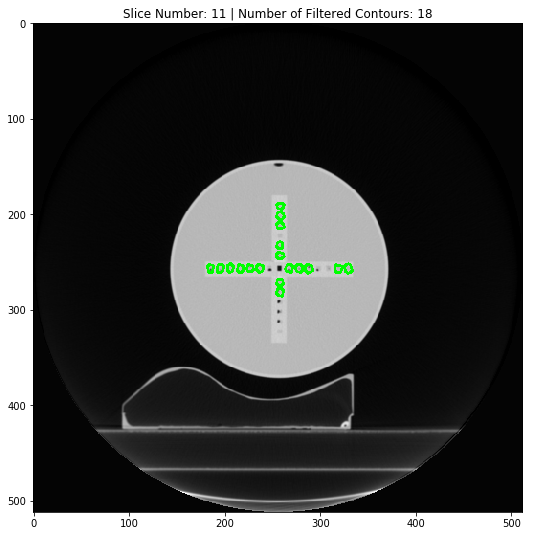

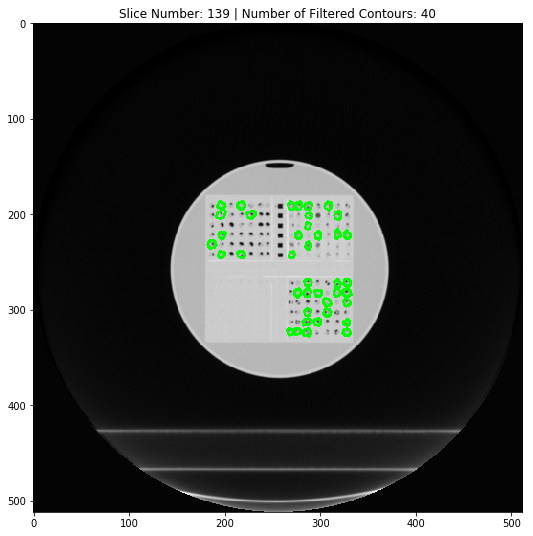

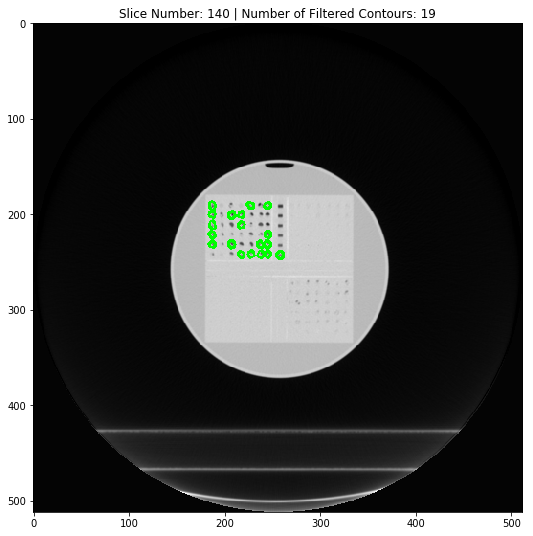

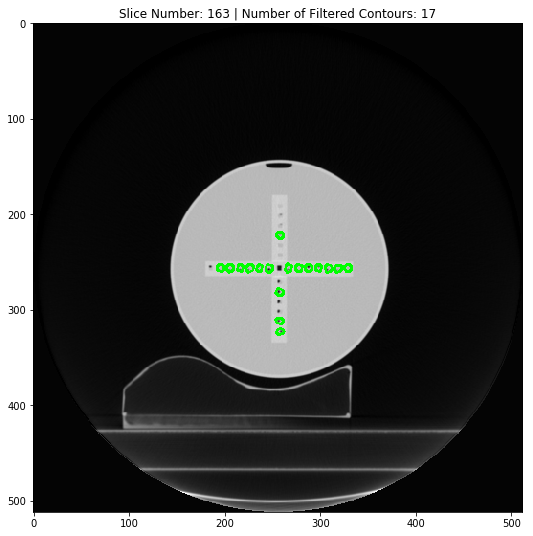

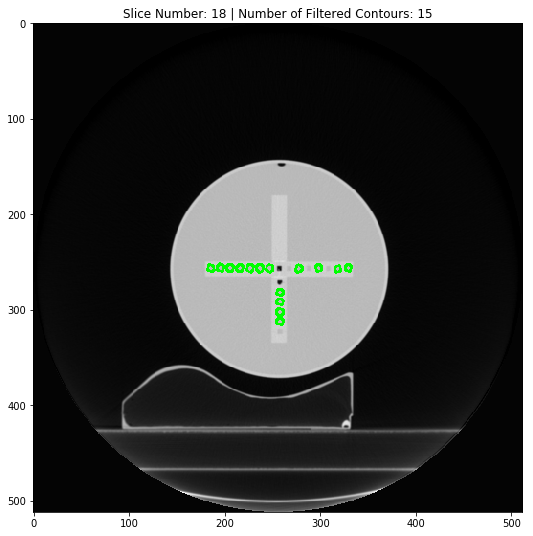

...

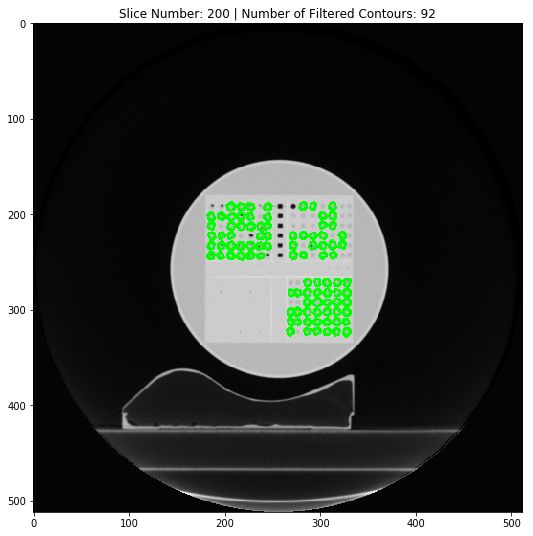

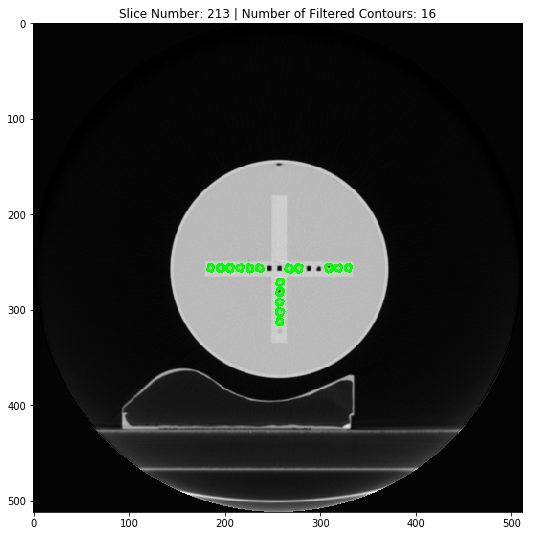

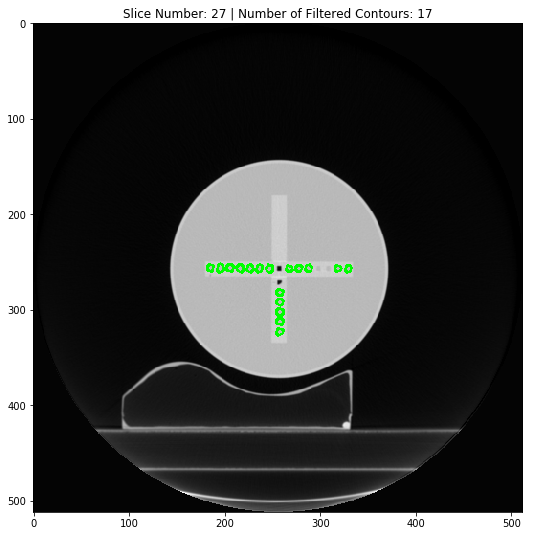

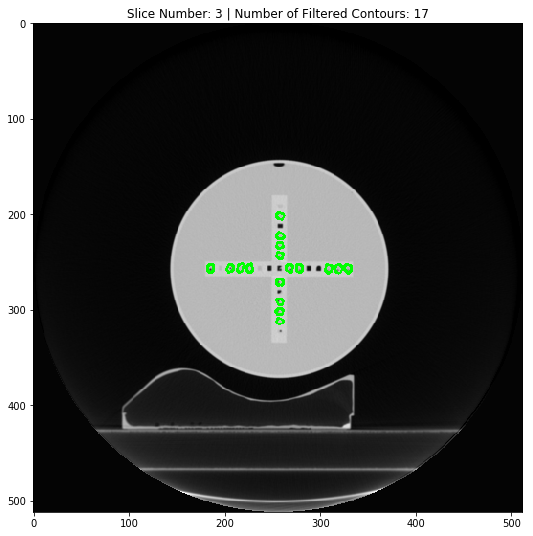

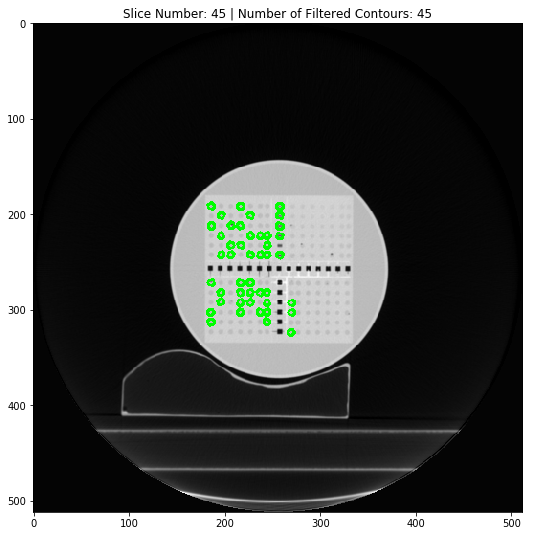

There are 15 slices with 10 or more detected inserts | Slice numbers: [11, 139, 140, 163, 18, 19, 196, 197, 198, 199, 200, 213, 27, 3, 45]


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder paths
dicom_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT Copy/" 
png_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT_PNG_V2/" 

# Convert DICOM images to PNG
i = 0
for file_name in os.listdir(dicom_folder_path):
    i+= 1
    if file_name.endswith(".dcm"):
        dicom_path = os.path.join(dicom_folder_path, file_name)
        dicom_image = pydicom.dcmread(dicom_path)
        png_file_name = str(i) + ".png"
        png_path = os.path.join(png_folder_path, png_file_name)

        # Normalize pixel values to the full range of 16-bit grayscale
        img = dicom_image.pixel_array
        img_min = np.min(img)
        img_max = np.max(img)
        img = ((img - img_min) / (img_max - img_min) * (2 ** 16 - 1)).astype(np.uint16)

        # Save the image as 16-bit grayscale PNG
        cv2.imwrite(png_path, img)

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the PNG folder
for file_name in os.listdir(png_folder_path):
    if file_name.endswith(".png"):
        slice_number = int(file_name[:-4]) # Extract the slice number from the file name
        image_path = os.path.join(png_folder_path, file_name)
        img = cv2.imread(image_path, 0)

        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
        #Original: ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS) 

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 30 #OG: 10 
        max_contour_area = 70
        max_distance_from_center = 160
        circularity_threshold = 0.8

        # Filter contours based on size and distance from center
        filtered_contours = []

        intensity_array = []
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                if distance_from_center <= max_distance_from_center:
                    if circularity >= circularity_threshold:
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 1 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))


## With DICOM images

Grava no folder "png_folder_path" os png gerados


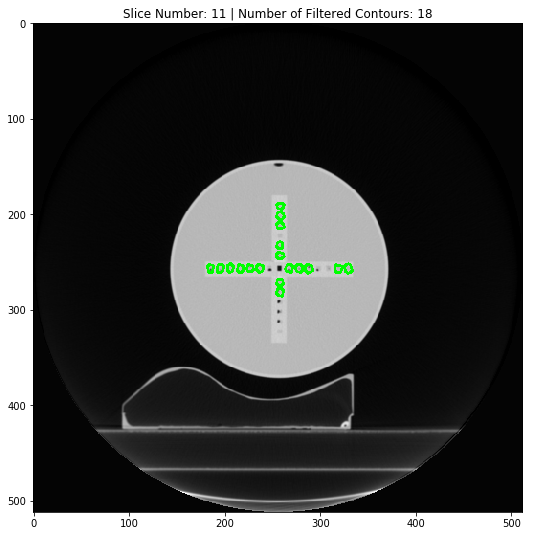

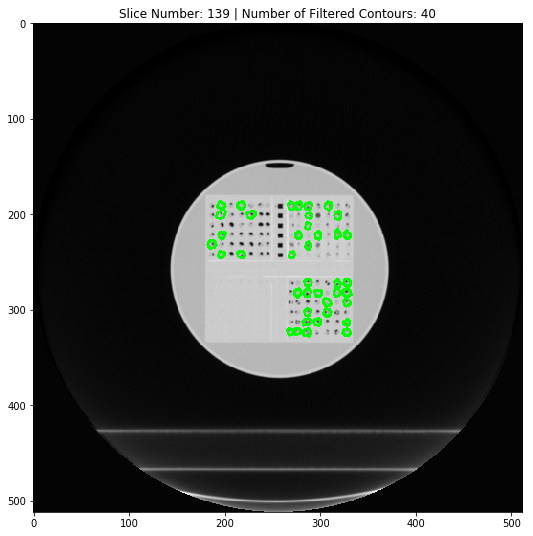

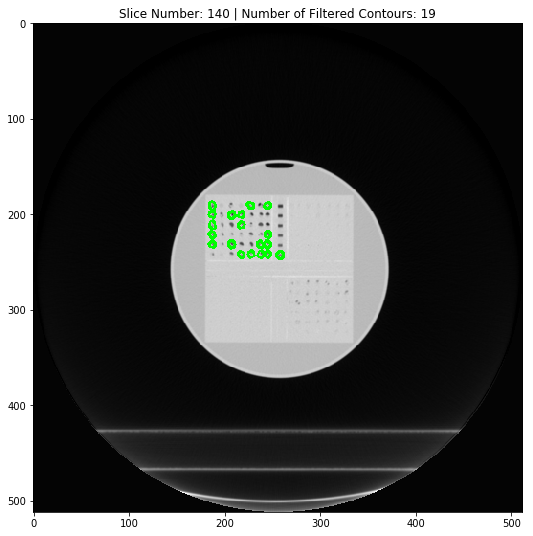

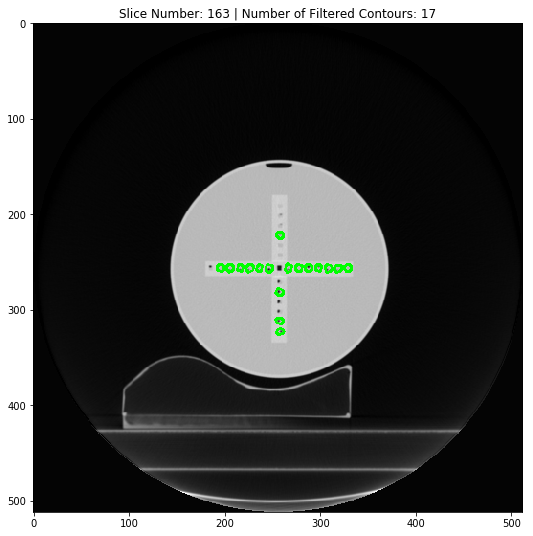

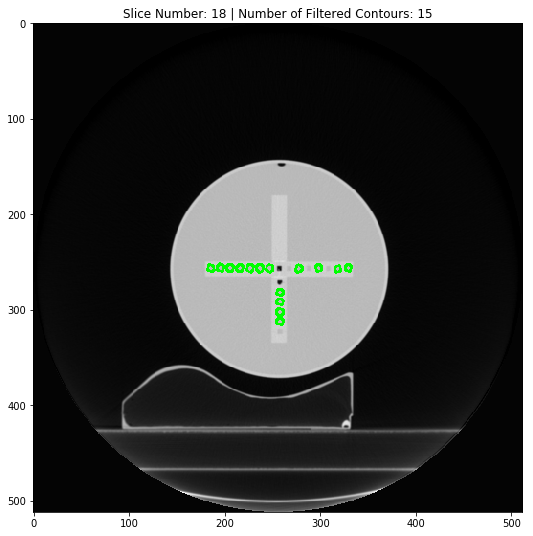

...

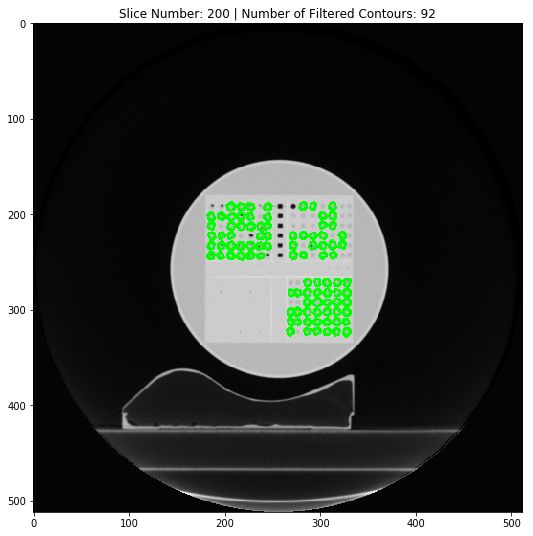

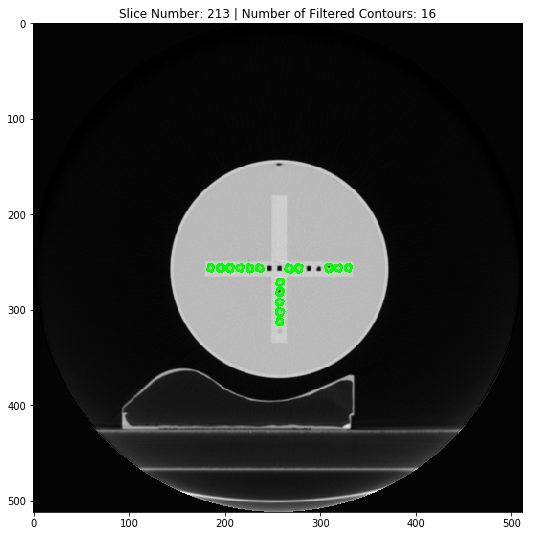

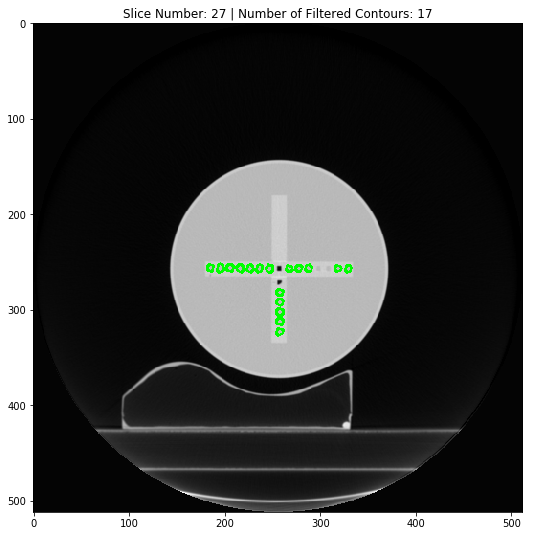

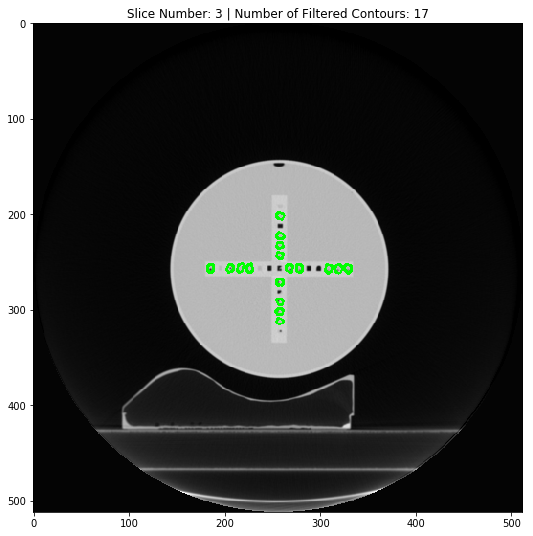

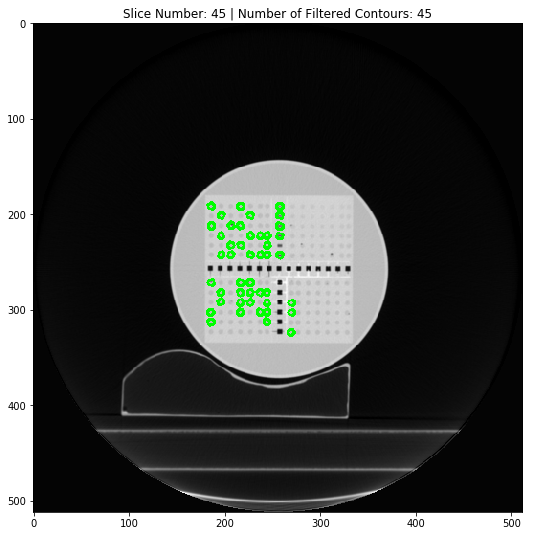

There are 15 slices with 10 or more detected inserts | Slice numbers: [11, 139, 140, 163, 18, 19, 196, 197, 198, 199, 200, 213, 27, 3, 45]


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder paths
dicom_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT Copy/"
png_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT_png_copy2/"

# Convert DICOM images to PNG
i = 0
for file_name in os.listdir(dicom_folder_path):
    #print(file_name[:-4])
    i += 1
    if file_name.endswith(".dcm"):
        dicom_path = os.path.join(dicom_folder_path, file_name)
        dicom_image = pydicom.dcmread(dicom_path)
        png_file_name = str(i) + ".png"
        png_path = os.path.join(png_folder_path, png_file_name)

        # Normalize pixel values to the full range of 16-bit grayscale
        img = dicom_image.pixel_array
        img_min = np.min(img)
        img_max = np.max(img)
        img = ((img - img_min) / (img_max - img_min) * (2 ** 16 - 1)).astype(np.uint16)

        # Save the image as 16-bit grayscale PNG
        cv2.imwrite(png_path, img)

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the PNG folder
for file_name in os.listdir(png_folder_path):
    if file_name.endswith(".png"):
        slice_number = int(file_name[:-4])  # Extract the slice number from the file name
        #print('SLICE NUMBER', slice_number)
        image_path = os.path.join(png_folder_path, file_name)
        img = cv2.imread(image_path, 0)

        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        # Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 30  # OG: 10
        max_contour_area = 70
        max_distance_from_center = 160
        circularity_threshold = 0.8

        # Filter contours based on size and distance from center
        filtered_contours = []

        intensity_array = []
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)

        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                if distance_from_center <= max_distance_from_center:
                    if circularity >= circularity_threshold:
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 1 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))


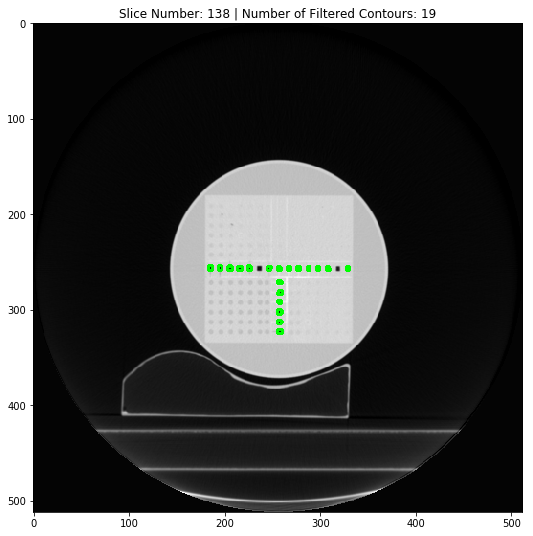

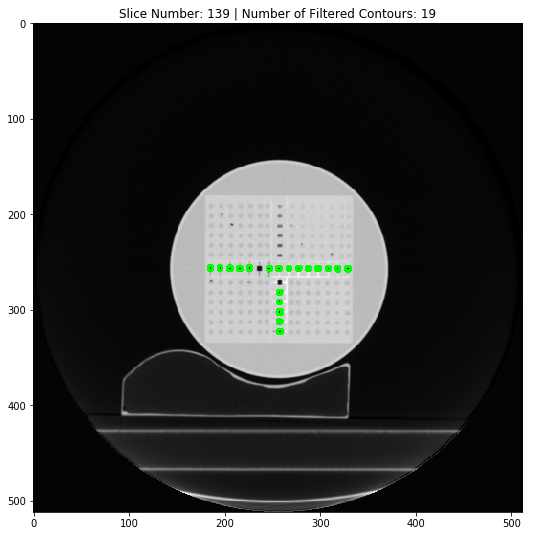

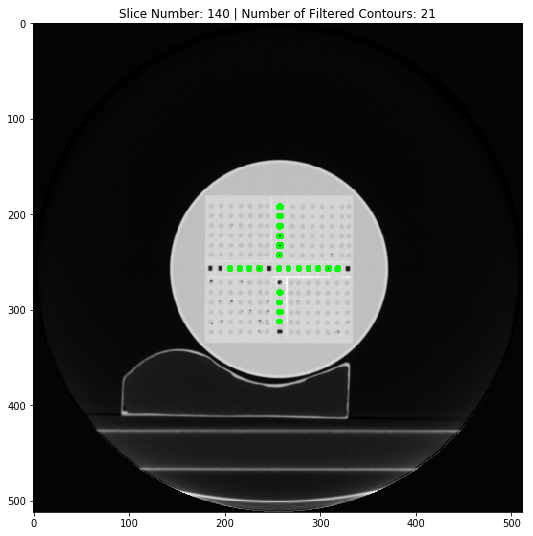

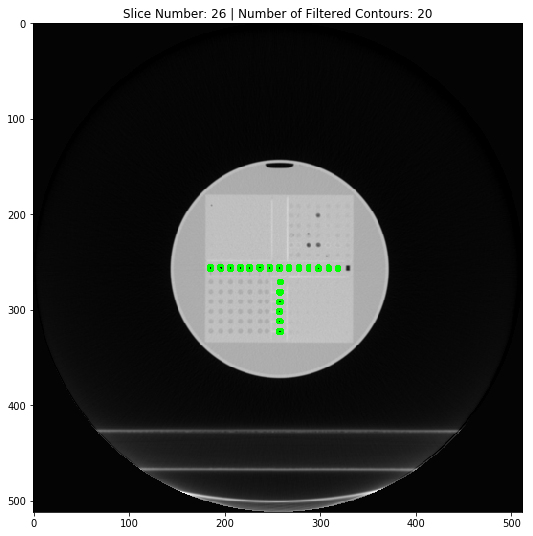

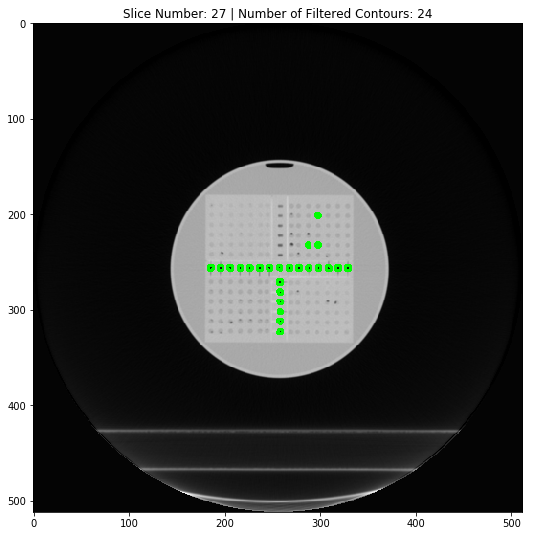

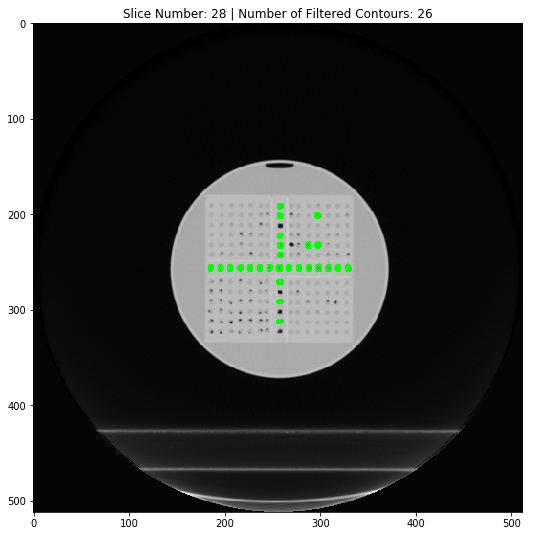

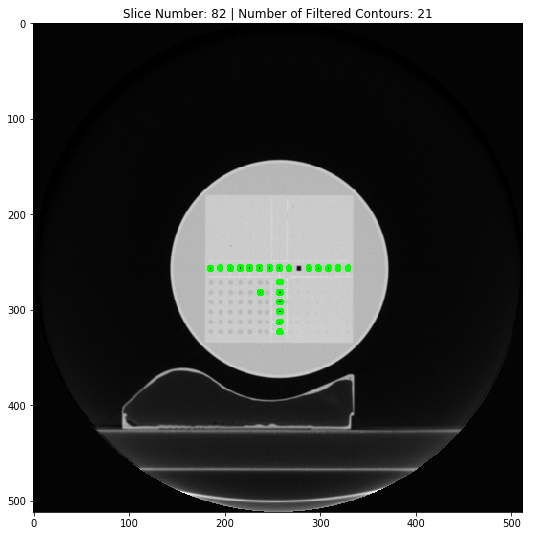

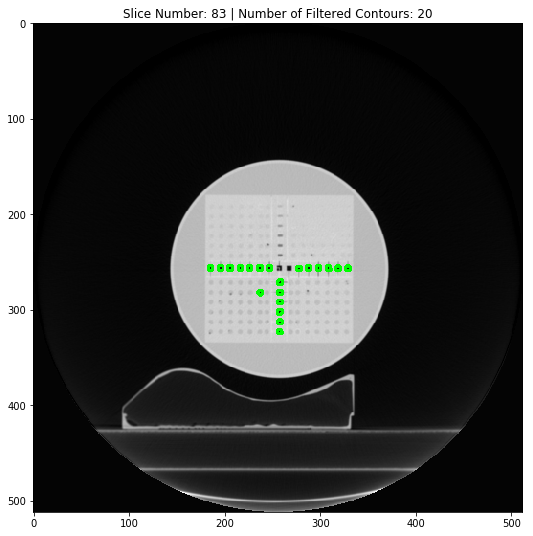

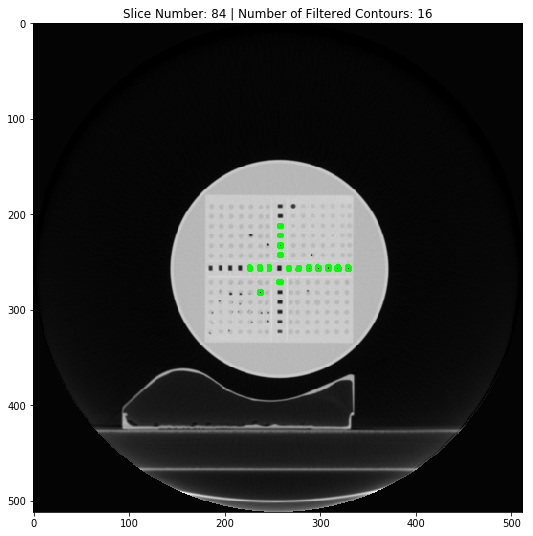

There are 9 slices with 10 or more detected inserts | Slice numbers: ['138', '139', '140', '26', '27', '28', '82', '83', '84']


In [7]:
#folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210"

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder path
folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210"

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".dcm"):
        image_path = os.path.join(folder_path, file_name)
        
        # Read DICOM image
        ds = pydicom.dcmread(image_path)

        # Extract slice number from DICOM metadata
        slice_number = ds.InstanceNumber

        # Read pixel data
        img = ds.pixel_array

        # Check if the image is already grayscale
        if len(img.shape) > 2 and img.shape[2] == 3:
            # Convert to grayscale
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray_img = img

        # Apply threshold
        ret, thresh = cv2.threshold(gray_img, 200, 255, cv2.THRESH_BINARY) #OG: 200,255

        # Ensure thresh is in the correct format (CV_8UC1)
        if thresh.dtype != np.uint8:
            thresh = thresh.astype(np.uint8)

        # Find contours
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        #original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
        #print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 10  # adjust as needed #OG: 10
        max_contour_area = 70  # adjust as needed #OG: 70
        max_distance_from_center = 160  # adjust as needed; para a mesa não aparecer #OG: 500
        #intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []


        intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
        #Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
        #Podia usar critério mais relaxado
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            # Calculate the area and perimeter of the contour
            perimeter = cv2.arcLength(contour, True)

            # Calculate the circularity of the contour
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                # Calculate the centroid of the contour
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])

                # Calculate the distance from the centroid to the center of the image
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Filter contours based on distance from center
                if distance_from_center <= max_distance_from_center:
                    # Filter contours based on circularity
                    if circularity >= circularity_threshold:
                        #filtered_contours.append(contour)
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        #print(mean_intensity)
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)


        # Convert the image to a compatible format before converting it to color
        img_8bit = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        #print('NÚMER DE CONTOURS depois dos filtros: ', len(filtered_contours))
        # Draw filtered contours on the original image
        image_with_filtered_contours = cv2.cvtColor(img_8bit, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)


        # Display the original image with filtered contours
        ##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
        ##cv2.waitKey(0)
        ##cv2.destroyAllWindows()


        #save output img
        ##cv2.imwrite('output_img.png', img)

        # display it
        
        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points%1 == 0: #so not all are shown, but only every 2 appliable slices, I can use %2, for example
                plt.figure(figsize=(9,9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
plt.show()
print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))

Versão final -> tentar que as imagens fiquem como inicialmente na versão de cima de tudo, agora apenas com DICOM como input

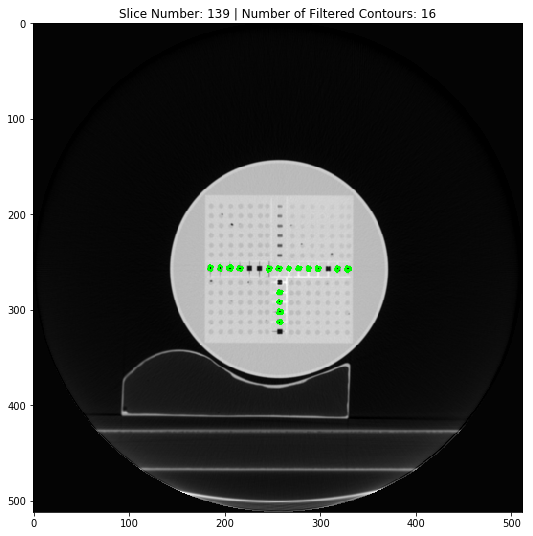

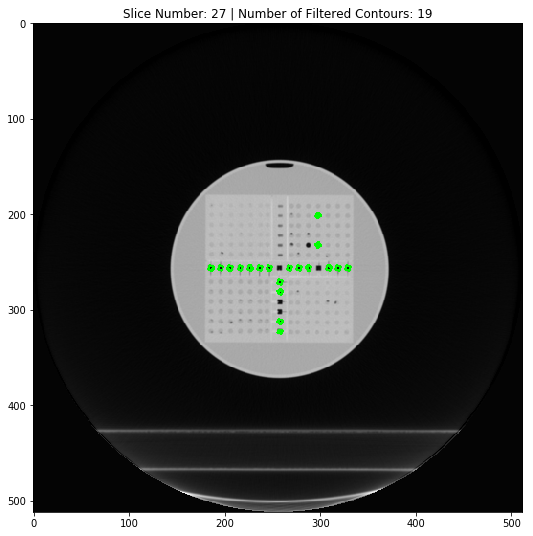

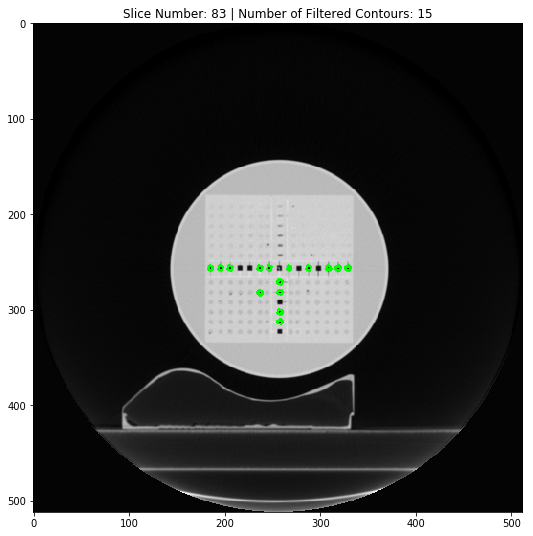

There are 3 slices with 10 or more detected inserts | Slice numbers: ['139', '27', '83']


In [8]:
#folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210"

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder path
folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210"

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".dcm"):
        image_path = os.path.join(folder_path, file_name)
        
        # Read DICOM image
        ds = pydicom.dcmread(image_path)

        # Extract slice number from DICOM metadata
        slice_number = ds.InstanceNumber

        # Read pixel data
        img = ds.pixel_array

        # Check if the image is already grayscale
        if len(img.shape) > 2 and img.shape[2] == 3:
            # Convert to grayscale
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray_img = img

        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
        #Original: ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)



        # Ensure thresh is in the correct format (CV_8UC1)
        if thresh.dtype != np.uint8:
            thresh = thresh.astype(np.uint8)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS) 
        #original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
        #print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 10  # adjust as needed #OG: 10
        max_contour_area = 70  # adjust as needed #OG: 70
        max_distance_from_center = 160  # adjust as needed; para a mesa não aparecer #OG: 500
        #intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []


        intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
        #Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
        #Podia usar critério mais relaxado
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            # Calculate the area and perimeter of the contour
            perimeter = cv2.arcLength(contour, True)

            # Calculate the circularity of the contour
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                # Calculate the centroid of the contour
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])

                # Calculate the distance from the centroid to the center of the image
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Filter contours based on distance from center
                if distance_from_center <= max_distance_from_center:
                    # Filter contours based on circularity
                    if circularity >= circularity_threshold:
                        #filtered_contours.append(contour)
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        #print(mean_intensity)
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)


        # Convert the image to a compatible format before converting it to color
        img_8bit = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        #print('NÚMER DE CONTOURS depois dos filtros: ', len(filtered_contours))
        # Draw filtered contours on the original image
        image_with_filtered_contours = cv2.cvtColor(img_8bit, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)


        # Display the original image with filtered contours
        ##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
        ##cv2.waitKey(0)
        ##cv2.destroyAllWindows()


        #save output img
        ##cv2.imwrite('output_img.png', img)

        # display it
        
        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points%1 == 0: #so not all are shown, but only every 2 appliable slices, I can use %2, for example
                plt.figure(figsize=(9,9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()
print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))

## DICOM variable list

In [10]:
import pydicom

# Specify the path to your DICOM file
dicom_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210/CT.1.2.840.113619.2.278.3.2831159384.586.1676011671.578.4.dcm"

# Read the DICOM file
ds = pydicom.dcmread(dicom_path)

# Print all metadata variables
print(ds)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 186
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.840.113619.2.278.3.2831159384.586.1676011671.578.4
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.246.352.70.2.1.160.3
(0002, 0013) Implementation Version Name         SH: 'DCIE 16.1'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0012) Instance Creation Date              DA: '20230223'
(0008, 0013) Instance Creation Time              TM: '121942'
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID 

In [11]:
import pydicom

# Specify the path to your DICOM file
#dicom_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210/CT.1.2.840.113619.2.278.3.2831159384.586.1676011671.578.4.dcm"
dicom_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI Copy/MR.1.2.752.24.3.3447912607.4062367.27503536.10147659823.1676389698.dcm"
# Read the DICOM file
ds = pydicom.dcmread(dicom_path)

# Print all metadata variables
print(ds)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 196
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.752.24.3.3447912607.4062367.27503536.10147659823.1676389698
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.246.352.70.2.1.160.3
(0002, 0013) Implementation Version Name         SH: 'DCIE 16.1'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'OTHER']
(0008, 0012) Instance Creation Date              DA: '20230223'
(0008, 0013) Instance Creation Time              TM: '121934'
(0008, 0016) SOP Class UID                       UI: MR Image Storage
(0008, 0018) SOP Inst